# ENV Setup

In [1]:
from tensorflow import keras

import matplotlib.pyplot as plt
import tensorflow as tf
import pandas as pd
import numpy as np
import imageio
import cv2
import os

In [2]:
IMG_SIZE = 224
BATCH_SIZE = 64
EPOCHS = 20

MAX_SEQ_LENGTH = 20
NUM_FEATURES = 2048

In [3]:
DATA_FOLDER = '/kaggle/input/deepfake-detection-challenge'
TRAIN_SAMPLE_FOLDER = 'train_sample_videos'
TEST_FOLDER = 'test_videos'

print(f"Train samples: {len(os.listdir(os.path.join(DATA_FOLDER, TRAIN_SAMPLE_FOLDER)))}")
print(f"Test samples: {len(os.listdir(os.path.join(DATA_FOLDER, TEST_FOLDER)))}")

Train samples: 401
Test samples: 400


# Data Preprocessing

In [4]:
train_sample_metadata = pd.read_json('/kaggle/input/deepfake-detection-challenge/train_sample_videos/metadata.json').T
train_sample_metadata.head()

,label,split,original
aagfhgtpmv.mp4,FAKE,train,vudstovrck.mp4
aapnvogymq.mp4,FAKE,train,jdubbvfswz.mp4
abarnvbtwb.mp4,REAL,train,None
abofeumbvv.mp4,FAKE,train,atvmxvwyns.mp4
abqwwspghj.mp4,FAKE,train,qzimuostzz.mp4


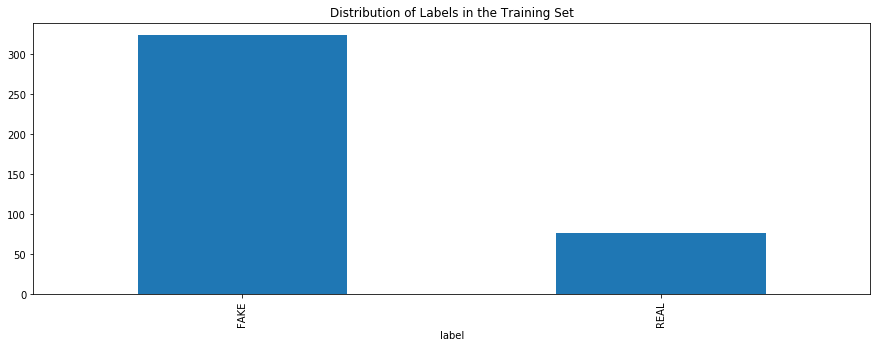

In [5]:
train_sample_metadata.groupby('label')['label'].count().plot(figsize=(15, 5), kind='bar', title='Distribution of Labels in the Training Set')
plt.show()

In [6]:
train_sample_metadata.shape

(400, 3)

In [7]:
fake_train_sample_video = list(train_sample_metadata.loc[train_sample_metadata.label=='FAKE'].sample(10).index)
fake_train_sample_video

['dzvyfiarrq.mp4',
 'diopzaywor.mp4',
 'bmioepcpsx.mp4',
 'btunxncpjh.mp4',
 'ebchwmwayp.mp4',
 'cxrfacemmq.mp4',
 'czfunozvwp.mp4',
 'amowujxmzc.mp4',
 'cthdnahrkh.mp4',
 'bahdpoesir.mp4']

In [8]:
import cv2
import matplotlib.pyplot as plt

def show_first_frame(video_file_path):
    
    video_capture = cv2.VideoCapture(video_file_path)
    
    # Verify that the video file was opened successfully
    if not video_capture.isOpened():
        video_capture.release()  # Ensure resources are released
        raise FileNotFoundError(f"Failed to access the video at {video_file_path}")
    
    # Attempt to capture the first frame
    successful, frame = video_capture.read()
    
    # Ensure that a frame was successfully captured
    if not successful:
        video_capture.release()  # Ensure resources are released before raising an error
        raise RuntimeError("No frames could be read from the video file")
    
    # Adjust the frame's color format for displaying
    frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
    
    # Display the frame using matplotlib
    plt.figure(figsize=(10, 10))
    plt.imshow(frame_rgb)
    plt.axis('off')  # Hide axes for better visualization
    plt.show()
    
    # Close the video capture object to free resources
    video_capture.release()

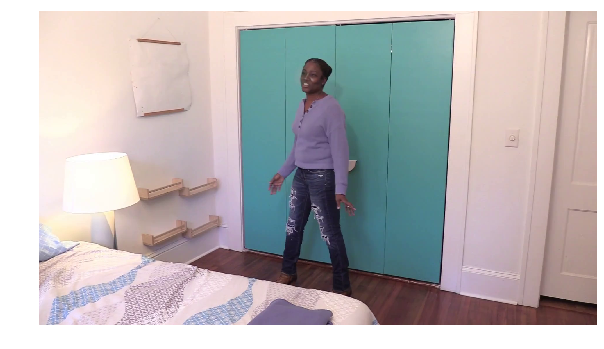

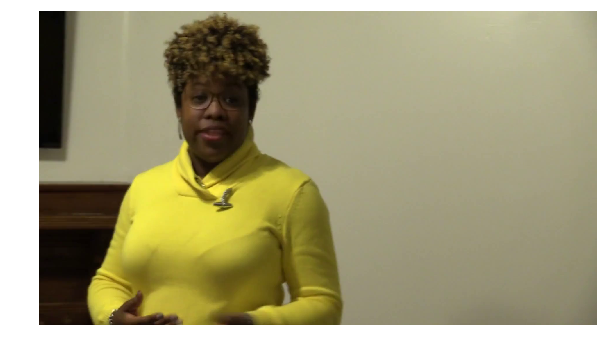

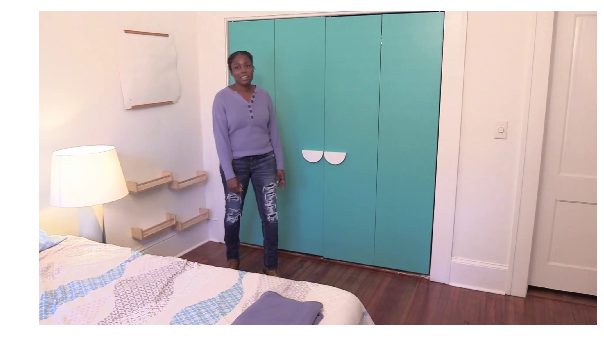

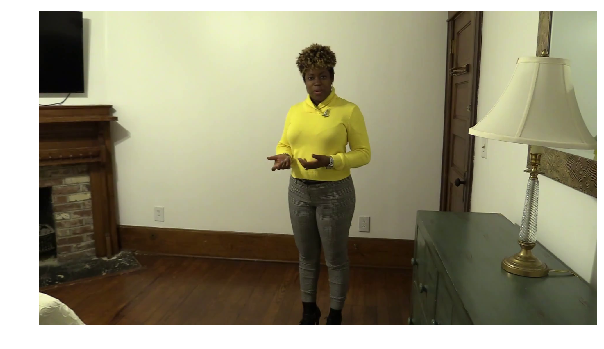

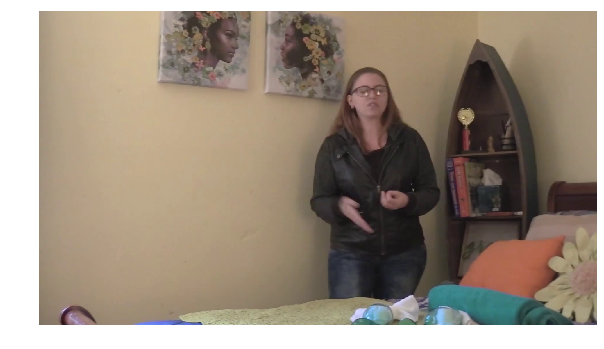

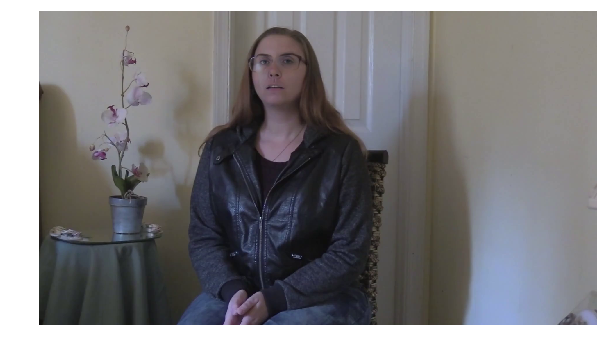

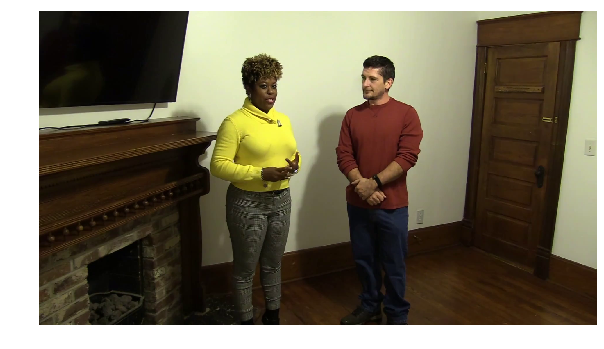

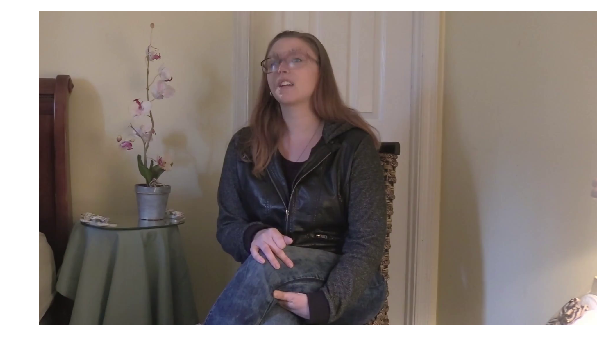

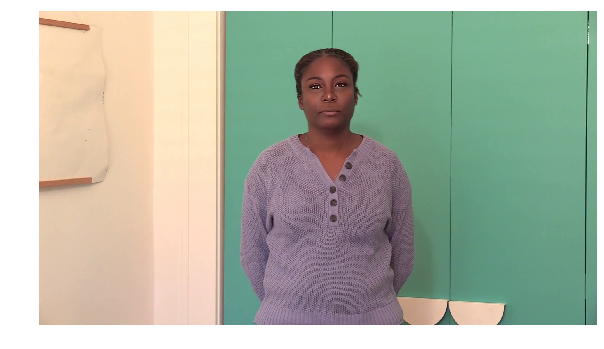

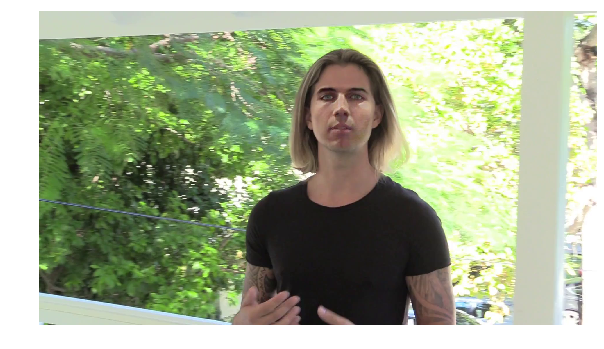

In [9]:
for video_file in fake_train_sample_video:
    show_first_frame(os.path.join(DATA_FOLDER, TRAIN_SAMPLE_FOLDER, video_file))

In [10]:
real_train_sample_video = list(train_sample_metadata.loc[train_sample_metadata.label=='REAL'].sample(10).index)
real_train_sample_video

['dsjbknkujw.mp4',
 'asaxgevnnp.mp4',
 'bmjzrlszhi.mp4',
 'efwfxwwlbw.mp4',
 'caifxvsozs.mp4',
 'dzyuwjkjui.mp4',
 'agrmhtjdlk.mp4',
 'dxbqjxrhin.mp4',
 'duycddgtrl.mp4',
 'bulkxhhknf.mp4']

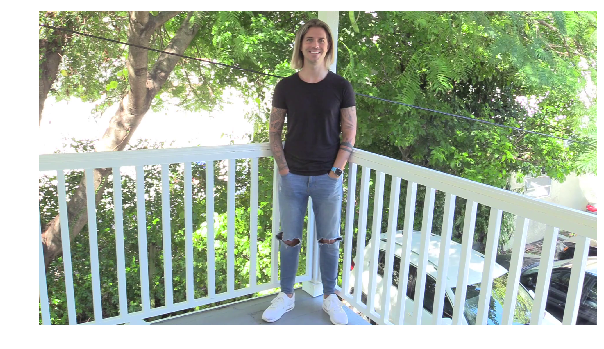

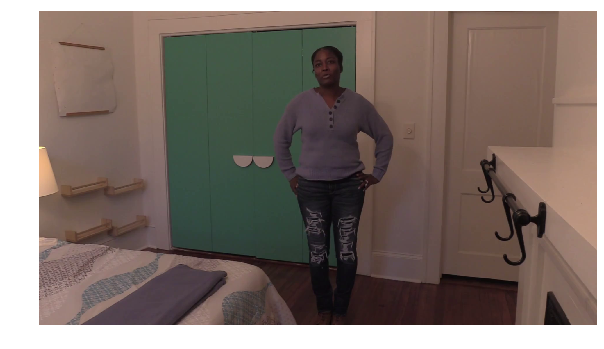

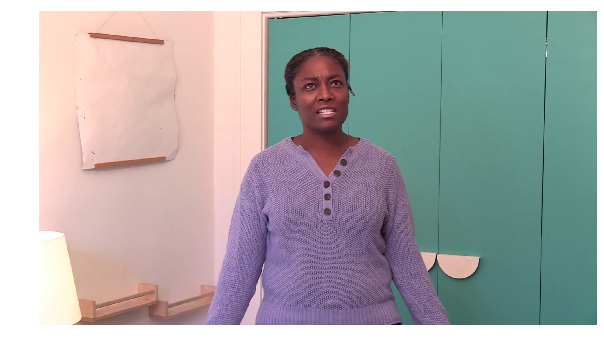

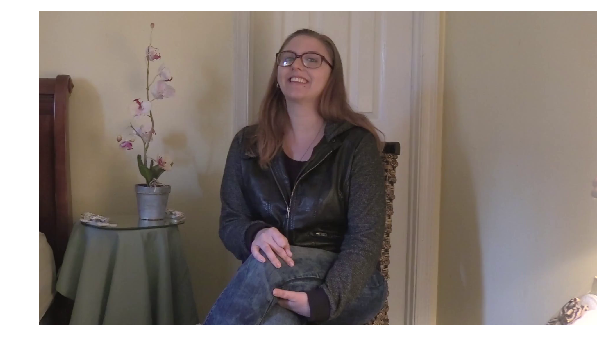

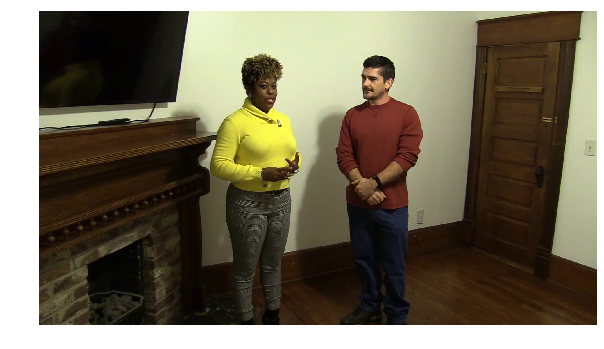

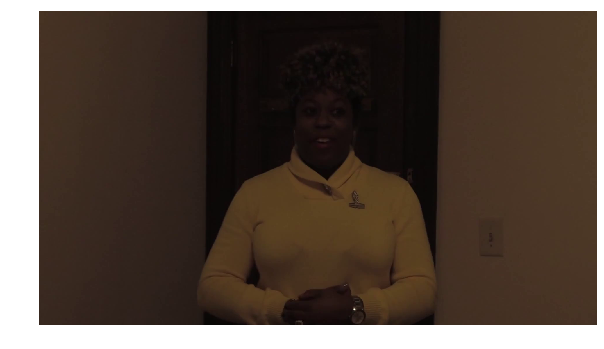

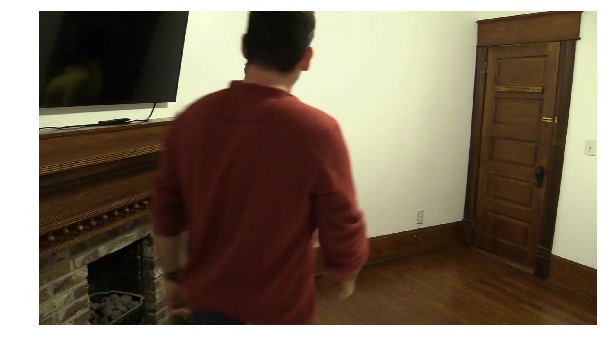

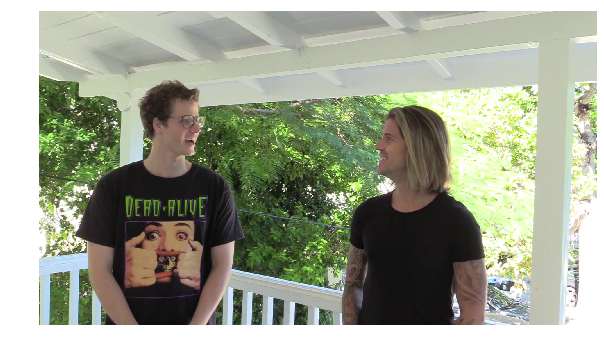

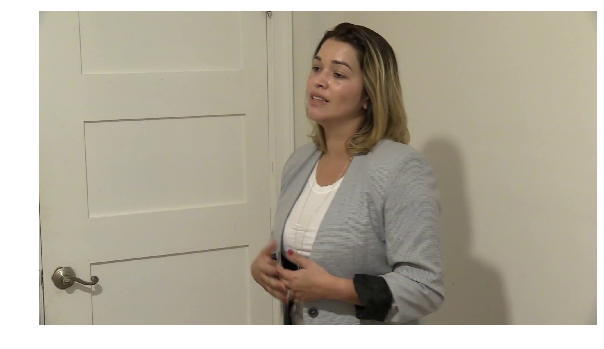

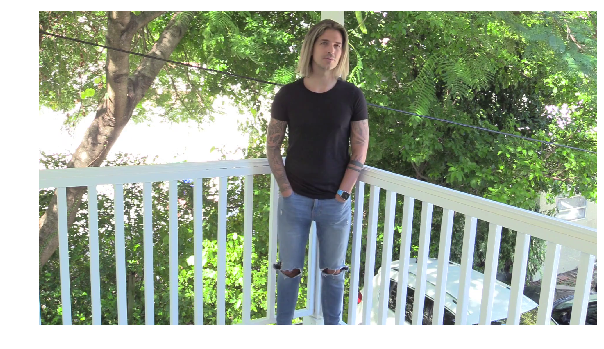

In [11]:
for video_file in real_train_sample_video:
    show_first_frame(os.path.join(DATA_FOLDER, TRAIN_SAMPLE_FOLDER, video_file))

In [12]:
train_sample_metadata['original'].value_counts()[0:10]

atvmxvwyns.mp4    6
meawmsgiti.mp4    6
kgbkktcjxf.mp4    5
qeumxirsme.mp4    5
gipbyjfxfp.mp4    4
ywvlvpvroj.mp4    4
xngpzquyhs.mp4    4
gbqrgajyca.mp4    4
fysyrqfguw.mp4    4
qzklcjjxdq.mp4    4
Name: original, dtype: int64

In [13]:
import os
import cv2
import matplotlib.pyplot as plt

def show_frames_from_videos(video_files, base_folder=TRAIN_SAMPLE_FOLDER):
    
    fig, axes = plt.subplots(2, 3, figsize=(16, 8))
    
    # Loop through the first six videos in the list
    for index, video_name in enumerate(video_files[:6]):
        video_full_path = os.path.join(DATA_FOLDER, base_folder, video_name)
        video_capture = cv2.VideoCapture(video_full_path)
        
        success, frame = video_capture.read()
        if not success:
            print(f"Failed to read from {video_name}")
            axes[index // 3, index % 3].set_title("Failed to load video")
            axes[index // 3, index % 3].axis('off')
            continue
        
        # Convert the color from BGR to RGB
        frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        
        # Display the image in the respective subplot
        axes[index // 3, index % 3].imshow(frame_rgb)
        axes[index // 3, index % 3].set_title(video_name)
        axes[index // 3, index % 3].axis('on')  # Keep the axis on for clarity
        
        # Release the video capture object
        video_capture.release()

    plt.tight_layout()
    plt.show()

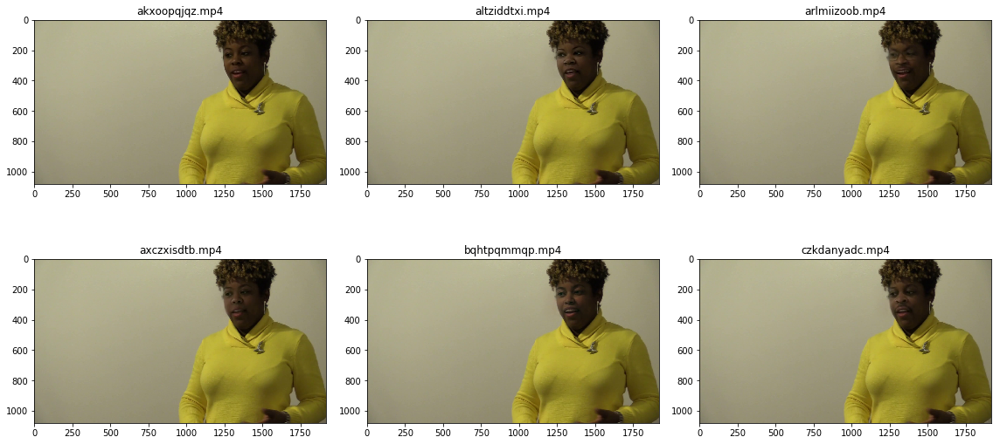

In [14]:
same_original_fake_train_sample_video = list(train_sample_metadata.loc[train_sample_metadata.original=='meawmsgiti.mp4'].index)
show_frames_from_videos(same_original_fake_train_sample_video)

In [15]:
test_videos = pd.DataFrame(list(os.listdir(os.path.join(DATA_FOLDER, TEST_FOLDER))), columns=['video'])

In [16]:
test_videos.head(10)

,video
0,qooxnxqqjb.mp4
1,hierggamuo.mp4
2,ocgdbrgmtq.mp4
3,icbsahlivv.mp4
4,prhmixykhr.mp4
5,ihglzxzroo.mp4
6,yarpxfqejd.mp4
7,orixbcfvdz.mp4
8,qxyrtwozyw.mp4
9,hqzwudvhih.mp4


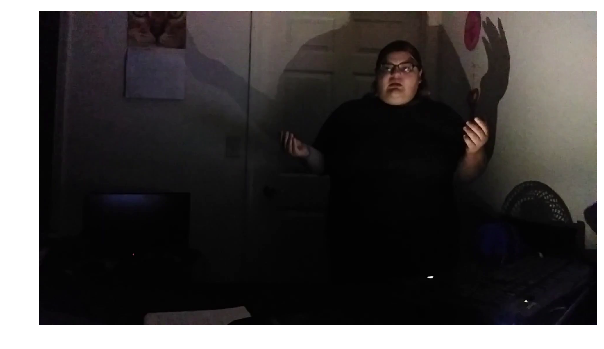

In [17]:
show_first_frame(os.path.join(DATA_FOLDER, TEST_FOLDER, test_videos.iloc[3].video))

In [18]:
fake_videos = list(train_sample_metadata.loc[train_sample_metadata.label=='FAKE'].index)

In [19]:
from IPython.display import HTML
from base64 import b64encode
import os

def embed_video_in_notebook(video_filename, directory=TRAIN_SAMPLE_FOLDER):
    try:
        # Construct the full path to the video file
        video_path = os.path.join(DATA_FOLDER, directory, video_filename)
        
        # Read the video file as binary data
        with open(video_path, 'rb') as video_file:
            video_data = video_file.read()

        # Encode the video data in base64 and create the data URL
        video_base64 = b64encode(video_data).decode('utf-8')
        data_url = f"data:video/mp4;base64,{video_base64}"

        # Return an HTML object that contains the video element
        return HTML(f'<video width="500" controls><source src="{data_url}" type="video/mp4"></video>')
    
    except FileNotFoundError:
        raise FileNotFoundError(f"The video file {video_filename} could not be found in {directory}.")

# Example usage:
# Assuming 'fake_videos[10]' contains the filename of the video to play
video_to_play = fake_videos[14] 
embed_video_in_notebook(video_to_play)

In [20]:
import cv2
import numpy as np

def square_crop_frame(image):
    
    height, width = image.shape[:2]
    min_dimension = min(height, width)
    start_x = (width - min_dimension) // 2
    start_y = (height - min_dimension) // 2
    return image[start_y:start_y + min_dimension, start_x:start_x + min_dimension]

def process_video_frames(video_path, max_frames=0, resize_dims=(IMG_SIZE, IMG_SIZE)):

    capture = cv2.VideoCapture(video_path)
    processed_frames = []
    try:
        while True:
            read_success, frame = capture.read()
            if not read_success:
                break
            frame = square_crop_frame(frame)
            frame = cv2.resize(frame, resize_dims)
            # Convert BGR to RGB for standard color format
            frame = frame[..., ::-1]
            processed_frames.append(frame)

            if max_frames > 0 and len(processed_frames) >= max_frames:
                break
    finally:
        capture.release()
    return np.array(processed_frames)

In [21]:
import tensorflow as tf
from tensorflow import keras

def build_feature_extractor(model_name='ResNet50'):
    # Get model class and preprocessing function
    base_model_class = getattr(keras.applications, model_name)
    preprocess_input = getattr(keras.applications, model_name.lower()).preprocess_input

    # Base model without top layers
    base_model = base_model_class(
        weights='imagenet',
        include_top=False,
        pooling='avg',
        input_shape=(IMG_SIZE, IMG_SIZE, 3)
    )

    # Build sequential model
    model = keras.Sequential([
        keras.layers.Lambda(preprocess_input, input_shape=(IMG_SIZE, IMG_SIZE, 3), name='preprocessing'),
        base_model
    ], name=f"{model_name}_feature_extractor_seq")

    return model

# Model Training

In [22]:
from sklearn.model_selection import train_test_split

Train_set, Test_set = train_test_split(train_sample_metadata,test_size=0.1,random_state=42,stratify=train_sample_metadata['label'])

print(Train_set.shape, Test_set.shape )

(360, 3) (40, 3)


## CNN(InceptionV3) + LSTM

In [23]:
import numpy as np
import os

feature_extractor = build_feature_extractor('ResNet50')

def extract_video_features(dataframe, directory):
    
    total_videos = len(dataframe)
    video_file_paths = dataframe.index.tolist()
    binary_labels = np.array(dataframe["label"].values == 'FAKE', dtype=int)

    # Initialize arrays to hold data for all videos
    video_masks = np.zeros((total_videos, MAX_SEQ_LENGTH), dtype=bool)
    video_features = np.zeros((total_videos, MAX_SEQ_LENGTH, NUM_FEATURES), dtype="float32")

    # Process each video individually
    for video_idx, video_file in enumerate(video_file_paths):
        full_video_path = os.path.join(directory, video_file)
        video_data = process_video_frames(full_video_path)
        video_data = np.expand_dims(video_data, axis=0)  # Add a batch dimension

        # Temporary storage for this video's data
        current_video_mask = np.zeros((1, MAX_SEQ_LENGTH), dtype=bool)
        current_video_features = np.zeros((1, MAX_SEQ_LENGTH, NUM_FEATURES), dtype="float32")

        # Frame-by-frame feature extraction
        frames_to_process = min(MAX_SEQ_LENGTH, video_data.shape[1])
        for frame_idx in range(frames_to_process):
            frame = video_data[:, frame_idx, :]
            extracted_features = feature_extractor.predict(frame[None, :])
            current_video_features[0, frame_idx, :] = extracted_features

        current_video_mask[0, :frames_to_process] = True  # Mark frames as valid

        # Store the extracted data in the corresponding arrays
        video_features[video_idx] = current_video_features.squeeze()
        video_masks[video_idx] = current_video_mask.squeeze()

    return (video_features, video_masks), binary_labels

94773248/94765736 [==============================] - 4s 0us/step


In [24]:
train_data, train_labels = extract_video_features(Train_set, "train")
test_data, test_labels = extract_video_features(Test_set, "test")

print(f"Frame features in train set: {train_data[0].shape}")
print(f"Frame masks in train set: {train_data[1].shape}")

Frame features in train set: (360, 20, 2048)
Frame masks in train set: (360, 20)


In [25]:
from tensorflow.keras import layers, models, regularizers, metrics

frame_features_input = layers.Input((MAX_SEQ_LENGTH, NUM_FEATURES))
mask_input = layers.Input((MAX_SEQ_LENGTH,), dtype="bool")

x = layers.LSTM(
    16, return_sequences=True, kernel_regularizer=regularizers.l2(0.01)
)(frame_features_input, mask=mask_input)

x = layers.LSTM(
    8, kernel_regularizer=regularizers.l2(0.01)
)(x)

x = layers.Dropout(0.5)(x)
x = layers.Dense(8, activation="relu")(x)
output = layers.Dense(1, activation="sigmoid")(x)

model = models.Model([frame_features_input, mask_input], output)

model.compile(
    loss="binary_crossentropy",
    optimizer="adam",
    metrics=[
        "accuracy",
        metrics.Recall(name="recall"),
        metrics.Precision(name="precision")
    ]
)

model.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            [(None, 20, 2048)]   0                                            
__________________________________________________________________________________________________
input_3 (InputLayer)            [(None, 20)]         0                                            
__________________________________________________________________________________________________
lstm (LSTM)                     (None, 20, 16)       132160      input_2[0][0]                    
__________________________________________________________________________________________________
lstm_1 (LSTM)                   (None, 8)            800         lstm[0][0]                       
______________________________________________________________________________________________

In [26]:
import os
from tensorflow.keras import callbacks, models

# Define the directory for storing model checkpoints and the final model
checkpoint_dir = './model_checkpoints'
os.makedirs(checkpoint_dir, exist_ok=True)  # Ensure the directory exists

# Setup the model checkpoint callback to save only the best model during training
checkpoint_filepath = os.path.join(checkpoint_dir, 'model-{epoch:02d}-{val_loss:.2f}.h5')
checkpoint_callback = callbacks.ModelCheckpoint(
    filepath=checkpoint_filepath,
    monitor='val_loss',
    verbose=1,
    save_best_only=True,
    save_weights_only=True,
    mode='min'
)

# EarlyStopping callback to stop training early if no improvement
early_stopping_callback = callbacks.EarlyStopping(
    monitor='val_loss',
    patience=10,
    verbose=1,
    mode='min',
    restore_best_weights=True
)

# Model training
history = model.fit(
    [train_data[0], train_data[1]],
    train_labels,
    validation_data=([test_data[0], test_data[1]], test_labels),
    epochs=10,
    batch_size=8,
    callbacks=[checkpoint_callback, early_stopping_callback],
    verbose=1
)

# Save the final model after training
final_model_path = os.path.join(checkpoint_dir, 'final_model6.h5')
model.save(final_model_path)
print(f"Model saved to {final_model_path}")

# Optionally, print the history of training
print("Training history:", history.history)

Train on 360 samples, validate on 40 samples
Epoch 1/10
336/360 [===========================>..] - ETA: 0s - loss: 1.2952 - accuracy: 0.7946 - recall: 0.9814 - precision: 0.8049
Epoch 00001: val_loss improved from inf to 0.85484, saving model to ./model_checkpoints/model-01-0.85.h5
360/360 [==============================] - 8s 22ms/sample - loss: 1.2663 - accuracy: 0.8028 - recall: 0.9828 - precision: 0.8125 - val_loss: 0.8548 - val_accuracy: 0.8000 - val_recall: 1.0000 - val_precision: 0.8000
Epoch 2/10
344/360 [===========================>..] - ETA: 0s - loss: 0.7982 - accuracy: 0.8169 - recall: 1.0000 - precision: 0.8169
Epoch 00002: val_loss improved from 0.85484 to 0.76268, saving model to ./model_checkpoints/model-02-0.76.h5
360/360 [==============================] - 1s 3ms/sample - loss: 0.7974 - accuracy: 0.8083 - recall: 1.0000 - precision: 0.8083 - val_loss: 0.7627 - val_accuracy: 0.8000 - val_recall: 1.0000 - val_precision: 0.8000
Epoch 3/10
344/360 [========================

### Model Evolution

In [27]:
# Evaluate the model on the test set
test_loss, test_accuracy, test_recall, test_precision = model.evaluate(
    [test_data[0], test_data[1]],  # Test features and masks
    test_labels,                   # Test labels
    batch_size=8                  # Use the batch size consistent with training
)

print(f"Test Loss: {test_loss:.4f}")
print(f"Test Accuracy: {test_accuracy:.4f}")
print(f"Test Recall: {test_recall:.4f}")
print(f"Test Precision: {test_precision:.4f}")

40/40 [==============================] - 0s 875us/sample - loss: 0.5994 - accuracy: 0.8000 - recall: 1.0000 - precision: 0.8000
Test Loss: 0.5994
Test Accuracy: 0.8000
Test Recall: 1.0000
Test Precision: 0.8000


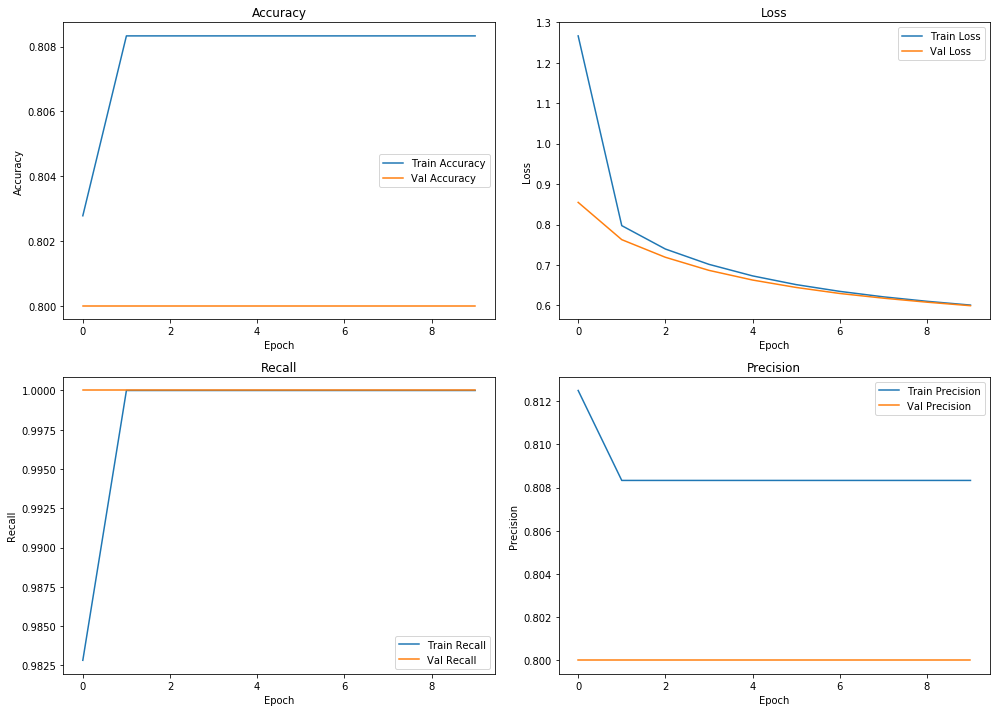

In [28]:
import matplotlib.pyplot as plt

# Assuming `history` is the result of model.fit()
hist = history.history

# Create 2x2 subplot
plt.figure(figsize=(14, 10))

# Plot Accuracy
plt.subplot(2, 2, 1)
plt.plot(hist['accuracy'], label='Train Accuracy')
plt.plot(hist['val_accuracy'], label='Val Accuracy')
plt.title('Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

# Plot Loss
plt.subplot(2, 2, 2)
plt.plot(hist['loss'], label='Train Loss')
plt.plot(hist['val_loss'], label='Val Loss')
plt.title('Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

# Plot Recall
plt.subplot(2, 2, 3)
plt.plot(hist['recall'], label='Train Recall')
plt.plot(hist['val_recall'], label='Val Recall')
plt.title('Recall')
plt.xlabel('Epoch')
plt.ylabel('Recall')
plt.legend()

# Plot Precision
plt.subplot(2, 2, 4)
plt.plot(hist['precision'], label='Train Precision')
plt.plot(hist['val_precision'], label='Val Precision')
plt.title('Precision')
plt.xlabel('Epoch')
plt.ylabel('Precision')
plt.legend()

plt.tight_layout()
plt.show()

In [29]:
y_pred_prob = model.predict([test_data[0], test_data[1]], batch_size=8)
y_pred = (y_pred_prob > 0.5).astype(int).flatten()

In [30]:
from sklearn.metrics import classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# Classification report
print(classification_report(test_labels, y_pred, digits=4))

              precision    recall  f1-score   support

           0     0.0000    0.0000    0.0000         8
           1     0.8000    1.0000    0.8889        32

    accuracy                         0.8000        40
   macro avg     0.4000    0.5000    0.4444        40
weighted avg     0.6400    0.8000    0.7111        40



/opt/conda/lib/python3.6/site-packages/sklearn/metrics/classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


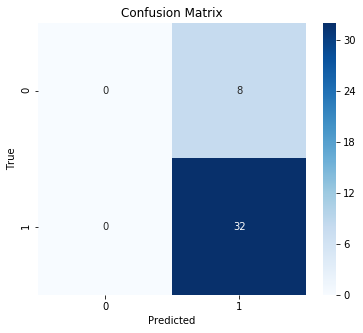

In [31]:
# Confusion matrix
cm = confusion_matrix(test_labels, y_pred)

# Plot confusion matrix
plt.figure(figsize=(6, 5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

## CNN(VGG16) + Bidirectional GRU

In [32]:
import numpy as np
import os

feature_extractor = build_feature_extractor('VGG16')

def extract_video_features(dataframe, directory):
    
    total_videos = len(dataframe)
    video_file_paths = dataframe.index.tolist()
    binary_labels = np.array(dataframe["label"].values == 'FAKE', dtype=int)

    # Initialize arrays to hold data for all videos
    video_masks = np.zeros((total_videos, MAX_SEQ_LENGTH), dtype=bool)
    video_features = np.zeros((total_videos, MAX_SEQ_LENGTH, NUM_FEATURES), dtype="float32")

    # Process each video individually
    for video_idx, video_file in enumerate(video_file_paths):
        full_video_path = os.path.join(directory, video_file)
        video_data = process_video_frames(full_video_path)
        video_data = np.expand_dims(video_data, axis=0)  # Add a batch dimension

        # Temporary storage for this video's data
        current_video_mask = np.zeros((1, MAX_SEQ_LENGTH), dtype=bool)
        current_video_features = np.zeros((1, MAX_SEQ_LENGTH, NUM_FEATURES), dtype="float32")

        # Frame-by-frame feature extraction
        frames_to_process = min(MAX_SEQ_LENGTH, video_data.shape[1])
        for frame_idx in range(frames_to_process):
            frame = video_data[:, frame_idx, :]
            extracted_features = feature_extractor.predict(frame[None, :])
            current_video_features[0, frame_idx, :] = extracted_features

        current_video_mask[0, :frames_to_process] = True  # Mark frames as valid

        # Store the extracted data in the corresponding arrays
        video_features[video_idx] = current_video_features.squeeze()
        video_masks[video_idx] = current_video_mask.squeeze()

    return (video_features, video_masks), binary_labels

58892288/58889256 [==============================] - 2s 0us/step


In [33]:
from tensorflow.keras import layers, models, regularizers, metrics

frame_features_input = layers.Input((MAX_SEQ_LENGTH, NUM_FEATURES))
mask_input = layers.Input((MAX_SEQ_LENGTH,), dtype="bool")

x = layers.Bidirectional(layers.LSTM(16, return_sequences=True, kernel_regularizer=regularizers.l2(0.01)))(
    frame_features_input, mask=mask_input
)
x = layers.Bidirectional(layers.LSTM(8, kernel_regularizer=regularizers.l2(0.01)))(x)
x = layers.Dropout(0.5)(x)
x = layers.Dense(8, activation="relu")(x)
output = layers.Dense(1, activation="sigmoid")(x)

model = models.Model([frame_features_input, mask_input], output)

model.compile(
    loss="binary_crossentropy",
    optimizer="adam",
    metrics=[
        "accuracy",
        metrics.Recall(name="recall"),
        metrics.Precision(name="precision")
    ]
)

model.summary()

Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_5 (InputLayer)            [(None, 20, 2048)]   0                                            
__________________________________________________________________________________________________
input_6 (InputLayer)            [(None, 20)]         0                                            
__________________________________________________________________________________________________
bidirectional (Bidirectional)   (None, 20, 32)       264320      input_5[0][0]                    
__________________________________________________________________________________________________
bidirectional_1 (Bidirectional) (None, 16)           2624        bidirectional[0][0]              
____________________________________________________________________________________________

In [34]:
import os
from tensorflow.keras import callbacks, models

# Define the directory for storing model checkpoints and the final model
checkpoint_dir = './model_checkpoints'
os.makedirs(checkpoint_dir, exist_ok=True)  # Ensure the directory exists

# Setup the model checkpoint callback to save only the best model during training
checkpoint_filepath = os.path.join(checkpoint_dir, 'bid-model-{epoch:02d}-{val_loss:.2f}.h5')
checkpoint_callback = callbacks.ModelCheckpoint(
    filepath=checkpoint_filepath,
    monitor='val_loss',
    verbose=1,
    save_best_only=True,
    save_weights_only=True,
    mode='min'
)

# EarlyStopping callback to stop training early if no improvement
early_stopping_callback = callbacks.EarlyStopping(
    monitor='val_loss',
    patience=10,
    verbose=1,
    mode='min',
    restore_best_weights=True
)

# Model training
history = model.fit(
    [train_data[0], train_data[1]],
    train_labels,
    validation_data=([test_data[0], test_data[1]], test_labels),
    epochs=10,
    batch_size=8,
    callbacks=[checkpoint_callback, early_stopping_callback],
    verbose=1
)

# Save the final model after training
final_model_path = os.path.join(checkpoint_dir, 'final_model6.h5')
model.save(final_model_path)
print(f"Model saved to {final_model_path}")

# Optionally, print the history of training
print("Training history:", history.history)

Train on 360 samples, validate on 40 samples
Epoch 1/10
344/360 [===========================>..] - ETA: 0s - loss: 2.0665 - accuracy: 0.7703 - recall: 0.9176 - precision: 0.8205
Epoch 00001: val_loss improved from inf to 1.15988, saving model to ./model_checkpoints/bid-model-01-1.16.h5
360/360 [==============================] - 13s 36ms/sample - loss: 2.0271 - accuracy: 0.7694 - recall: 0.9210 - precision: 0.8171 - val_loss: 1.1599 - val_accuracy: 0.8000 - val_recall: 1.0000 - val_precision: 0.8000
Epoch 2/10
344/360 [===========================>..] - ETA: 0s - loss: 1.0228 - accuracy: 0.8052 - recall: 1.0000 - precision: 0.8052
Epoch 00002: val_loss improved from 1.15988 to 0.92588, saving model to ./model_checkpoints/bid-model-02-0.93.h5
360/360 [==============================] - 1s 4ms/sample - loss: 1.0185 - accuracy: 0.8083 - recall: 1.0000 - precision: 0.8083 - val_loss: 0.9259 - val_accuracy: 0.8000 - val_recall: 1.0000 - val_precision: 0.8000
Epoch 3/10
344/360 [===============

### Model Evolution

In [35]:
# Evaluate the model on the test set
test_loss, test_accuracy, test_recall, test_precision = model.evaluate(
    [test_data[0], test_data[1]],  # Test features and masks
    test_labels,                   # Test labels
    batch_size=8                  # Use the batch size consistent with training
)

print(f"Test Loss: {test_loss:.4f}")
print(f"Test Accuracy: {test_accuracy:.4f}")
print(f"Test Recall: {test_recall:.4f}")
print(f"Test Precision: {test_precision:.4f}")

40/40 [==============================] - 0s 1ms/sample - loss: 0.6007 - accuracy: 0.8000 - recall: 1.0000 - precision: 0.8000
Test Loss: 0.6007
Test Accuracy: 0.8000
Test Recall: 1.0000
Test Precision: 0.8000


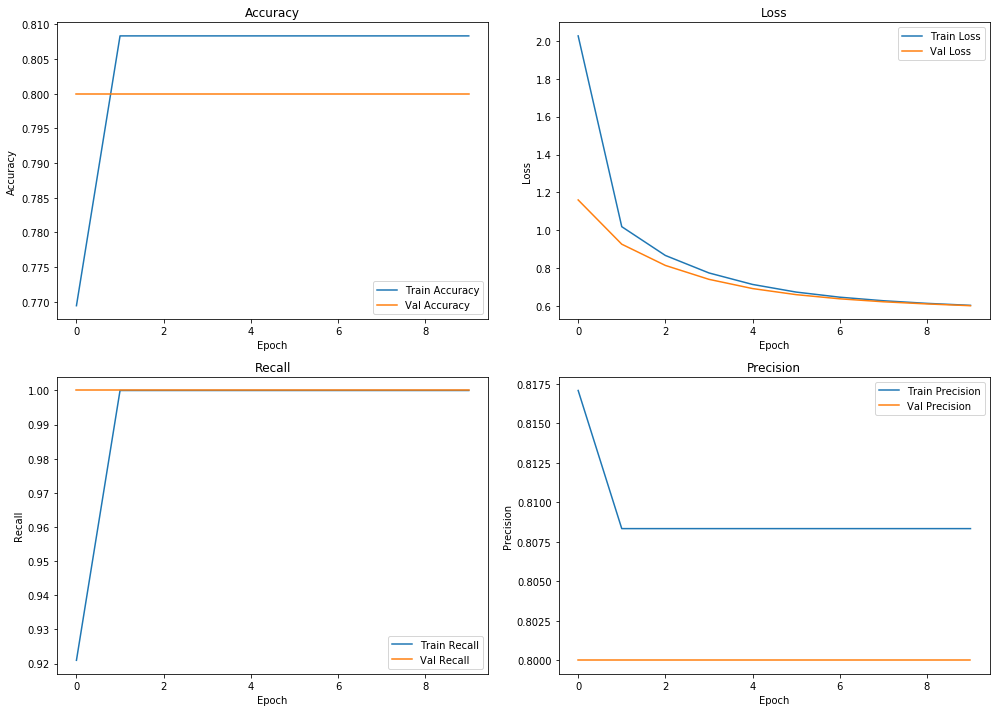

In [36]:
import matplotlib.pyplot as plt

# Assuming `history` is the result of model.fit()
hist = history.history

# Create 2x2 subplot
plt.figure(figsize=(14, 10))

# Plot Accuracy
plt.subplot(2, 2, 1)
plt.plot(hist['accuracy'], label='Train Accuracy')
plt.plot(hist['val_accuracy'], label='Val Accuracy')
plt.title('Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

# Plot Loss
plt.subplot(2, 2, 2)
plt.plot(hist['loss'], label='Train Loss')
plt.plot(hist['val_loss'], label='Val Loss')
plt.title('Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

# Plot Recall
plt.subplot(2, 2, 3)
plt.plot(hist['recall'], label='Train Recall')
plt.plot(hist['val_recall'], label='Val Recall')
plt.title('Recall')
plt.xlabel('Epoch')
plt.ylabel('Recall')
plt.legend()

# Plot Precision
plt.subplot(2, 2, 4)
plt.plot(hist['precision'], label='Train Precision')
plt.plot(hist['val_precision'], label='Val Precision')
plt.title('Precision')
plt.xlabel('Epoch')
plt.ylabel('Precision')
plt.legend()

plt.tight_layout()
plt.show()

In [37]:
y_pred_prob = model.predict([test_data[0], test_data[1]], batch_size=8)
y_pred = (y_pred_prob > 0.5).astype(int).flatten()

In [38]:
from sklearn.metrics import classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# Classification report
print(classification_report(test_labels, y_pred, digits=4))

              precision    recall  f1-score   support

           0     0.0000    0.0000    0.0000         8
           1     0.8000    1.0000    0.8889        32

    accuracy                         0.8000        40
   macro avg     0.4000    0.5000    0.4444        40
weighted avg     0.6400    0.8000    0.7111        40



/opt/conda/lib/python3.6/site-packages/sklearn/metrics/classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


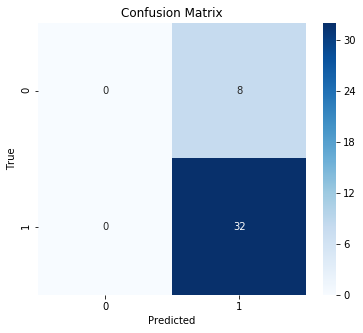

In [39]:
# Confusion matrix
cm = confusion_matrix(test_labels, y_pred)

# Plot confusion matrix
plt.figure(figsize=(6, 5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

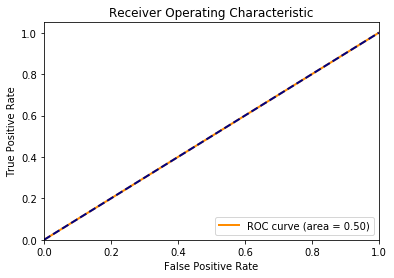

In [40]:
from sklearn.metrics import roc_curve, auc

# Compute ROC curve and ROC area
fpr, tpr, _ = roc_curve(test_labels, y_pred)
roc_auc = auc(fpr, tpr)

# Plotting ROC curve
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic')
plt.legend(loc="lower right")
plt.show()